# Split-as-a-Pro: Image Restoration

This notebook frames image restoration as a **behavioral optimization** problem.  

An image is modeled as a trajectory $w \in \mathbf{W}^{\mathbf{T}}$, with $\mathbf{T}$ the spatial index set (pixels) and $\mathbf{W}$ the signal alphabet (intensity values). The goal is to select a trajectory that is consistent with a prior behavior $\mathbf{B} \subseteq \mathbf{W}^{\mathbf{T}}$ (encoding structure or regularity) and a data set $\mathbf{C} \subseteq \mathbf{W}^{\mathbf{T}}$ (capturing measurements and constraints). When additional preferences are present, we minimize a cost $\mathbf{c} : \mathbf{W}^{\mathbf{T}} \to \mathbb{R}$.

Formally, we solve the optimization problem:
$$
 \begin{array}{ll}
 \underset{w \in \mathbf{W}^{\mathbf{T}}}{\text{minimize}} & \mathbf{c}(w) \\
 \text{subject to} & w \in \mathbf{B} \cap \mathbf{C}.
 \end{array}
$$

The feasibility problem arises in the special case $\mathbf{c} \equiv 0$, yielding
$$
 \begin{array}{ll}
 \underset{w \in \mathbf{W}^{\mathbf{T}}}{\text{find}} & w \in \mathbf{B} \cap \mathbf{C}.
 \end{array}
$$

In this notebook we illustrate both formulations. Feasibility is approached with alternating projections and Douglas–Rachford splitting. Approximation is demonstrated with Davis–Yin splitting and a total variation cost, yielding smoother reconstructions under noisy data.

**Conference paper**: https://arxiv.org/abs/2505.19411 | **Journal paper**: (add link here)

---

### Outline

1. Run the single setup cell (installs `proxop`, `numpy`, `scikit-image`, etc.).  
2. Set dataset (`synthetic` or `camera`) and prior (`box` or `lowpass`).  
3. Choose data-consistency mode (`exact`, `clip`, or `tube`) and tune parameters.  
4. Execute and inspect the images and curves.

---

## Setup

This cell installs dependencies, sets up configuration parameters, and imports the required libraries.  
- **Dataset:** `synthetic` (rectangle) or `camera` (standard photograph).  
- **Behavior $\mathbf{B}$:** `box` (pixel values in [0,1]) or `lowpass` (Fourier disk).  
- **Data set $\mathbf{C}$:** controlled by `CONSISTENCY`:  
  - `exact`: hard equality with noisy pixels,  
  - `clip`: enforce after prior projection,  
  - `tube`: masked $\ell_2$-ball constraint to absorb noise.  
- **Algorithms:** Alternating Projections (AP), Douglas–Rachford (DR), and Davis–Yin with Total Variation (DY–TV).  
- **Key parameters:** iteration count (`ITERS`), mask probability (`KEEP_PROB`), noise level (`NOISE_STD`), low-pass radius (`LOWPASS_RAD`), DR relaxation (`DR_LAM`), and TV regularization parameters (`LAMBDA_TV`, `GAMMA_DY`, `TV_INNER_IT`).  

All hyperparameters are collected in one place for easy modification.


In [37]:
# ==========================================================
# Image Restoration via Split-as-a-Pro
# Author: Alberto Padoan
# Last modified: August 2025
# License: Creative Commons Attribution-ShareAlike 4.0 International (CC BY-SA 4.0)
# ==========================================================

# Install required dependencies (quiet mode in Colab)
# !pip install -q proxop numpy scipy matplotlib scikit-image

# Imports
import numpy as np
import matplotlib.pyplot as plt
from proxop import BoxConstraint
from skimage import data, color
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
from skimage.restoration import denoise_tv_chambolle

# ---------------------------
# Config (experiment parameters)
# ---------------------------

# Dataset choice: 'synthetic' (rectangle) or 'camera' (grayscale photo)
DATASET      = 'synthetic'

# Video parameters
NUM_FRAMES   = 15    # number of frames in video sequence
USE_VIDEO    = True  # set to True for video restoration

# Behavior B: 'box' (pixel range [0,1]) or 'lowpass' (band-limited Fourier disk)
SECOND_SET   = 'box'

# Data set C: type of consistency with observed pixels
#   'exact' — force equality with noisy pixels
#   'clip'  — enforce equality after projecting through B
#   'tube'  — allow noise via an ℓ2 ball constraint
CONSISTENCY  = 'tube'

# Observation model
KEEP_PROB    = 0.7   # probability of a pixel being observed (mask density)
NOISE_STD    = 0.10  # Gaussian noise standard deviation

# Iterations for AP/DR/DY
ITERS        = 100

# Low-pass projection parameter (if SECOND_SET == 'lowpass')
LOWPASS_RAD  = 18

# Random seed for reproducibility
RNG_SEED     = 10

# Douglas–Rachford relaxation parameter λ ∈ (0,2)
# λ = 1 → standard DR, λ = 2 → Peaceman–Rachford (often less stable)
DR_LAM       = 1.0

# Davis–Yin with TV regularization parameters
LAMBDA_TV    = 0.12  # weight of TV penalty
GAMMA_DY     = 1.0   # step size
TV_INNER_IT  = 25    # inner iterations for TV prox

# Dynamics constraint weight (for temporal consistency)
LAMBDA_DYN   = 0.5   # weight for enforcing linear dynamics between frames

## Utilities

Helper functions for preprocessing, projections, and error metrics:  
- `to_gray01`: convert to grayscale and normalize to $[0,1]$.  
- `proj_lowpass`: project onto band-limited images via Fourier disk.  
- `rel_error`: relative error $\|x - x^\star\| / \|x^\star\|$.  
- `tv_iso`: isotropic total variation seminorm.  
- `clip01`: clip values to $[0,1]$.  
- `prox_tv`: wrapper around `skimage`’s TV prox (handles API changes).  

In [38]:
# ---------------------------
# Utilities

# ---------------------------

# Random generator (reproducibility controlled by RNG_SEED)
rs = np.random.default_rng(RNG_SEED)

def to_gray01(img):
    """
    Convert image to grayscale float32 in [0,1].

    If RGB, convert to grayscale; then normalize by shifting and scaling
    so the minimum maps to 0 and the maximum to 1.

    Args:
        img (ndarray): Input image (H×W or H×W×3).

    Returns:
        ndarray: Grayscale float32 image with values in [0,1].
    """
    img = img.astype(np.float32)
    if img.ndim == 3 and img.shape[2] == 3:
        img = color.rgb2gray(img)
    mn, mx = img.min(), img.max()
    return (img - mn) / (mx - mn + 1e-12)


def proj_lowpass(x, radius=20):
    """
    Fourier-domain projection onto band-limited images.

    Keeps only frequencies inside a centered disk of radius `radius`,
    zeroing all other coefficients.

    Args:
        x (ndarray): Input 2D image.
        radius (int): Radius of low-pass Fourier disk (default=20).

    Returns:
        ndarray: Band-limited approximation (real-valued).
    """
    X = np.fft.fft2(x)
    n, m = x.shape
    cx, cy = n // 2, m // 2
    yy, xx = np.ogrid[:n, :m]
    mask = (yy - cx)**2 + (xx - cy)**2 <= radius**2
    Y = np.zeros_like(X)
    Y[mask] = X[mask]
    return np.fft.ifft2(Y).real


def rel_error(x, ref):
    """
    Compute relative error ||x - ref|| / ||ref|| in Frobenius norm.

    Args:
        x (ndarray): Candidate image.
        ref (ndarray): Reference (ground truth).

    Returns:
        float: Relative error.
    """
    num = np.linalg.norm((x - ref).ravel())
    den = np.linalg.norm(ref.ravel()) + 1e-12
    return num / den


def tv_iso(x):
    """
    Compute isotropic total variation (TV) seminorm of an image.

    Approximates TV by finite differences along x- and y-axes.

    Args:
        x (ndarray): Input 2D image.

    Returns:
        float: Isotropic TV value.
    """
    dx = np.diff(x, axis=1, append=x[:, -1:])
    dy = np.diff(x, axis=0, append=x[-1:, :])
    return np.sum(np.sqrt(dx*dx + dy*dy))


def clip01(z):
    """
    Clip values of an array to [0,1].

    Args:
        z (ndarray): Input array.

    Returns:
        ndarray: Array with all entries in [0,1].
    """
    return np.clip(z, 0, 1)


def prox_tv(y, lam, inner_it=25):
    """
    Compute TV proximal operator via Chambolle’s algorithm.

    Wrapper around skimage's `denoise_tv_chambolle` to ensure compatibility
    with API changes across versions.

    Args:
        y (ndarray): Input image.
        lam (float): TV regularization weight.
        inner_it (int): Number of inner iterations (default=25).

    Returns:
        ndarray: Denoised image (proximal result).
    """
    try:
        return denoise_tv_chambolle(y, weight=lam, n_iter_max=inner_it, channel_axis=None)
    except TypeError:
        try:
            return denoise_tv_chambolle(y, weight=lam, max_num_iter=inner_it, channel_axis=None)
        except TypeError:
            return denoise_tv_chambolle(y, weight=lam, channel_axis=None)


## Data (ground truth and degradation model)

Generate the ground-truth image $x_\star$ and its degraded version:  
- **Ground truth ($x_\star$):** either a synthetic rectangle or the `camera` image.  
- **Mask ($\Omega$):** random binary mask with retention probability `KEEP_PROB`.  
- **Observed image ($y_{\text{obs}}$):** masked ground truth.  
- **Noisy observation ($y_{\text{noisy}}$):** add Gaussian noise with standard deviation `NOISE_STD`.  

Formally, the degradation model is
$$
\begin{aligned}
x_\star &\in [0,1]^{n \times m}, \\[6pt]
y_{\text{obs}} &= \Omega \odot x_\star, \\[6pt]
y_{\text{noisy}} &= y_{\text{obs}} + \nu, \qquad \nu \sim \mathbf{N}(0, \sigma^2 I),
\end{aligned}
$$

where  
- $\Omega \in \{0,1\}^{n \times m}$ is the random mask with $\mathbf{P}[\Omega_{ij}=1] =$ `KEEP_PROB`,  
- $\odot$ denotes elementwise (Hadamard) multiplication,  
- $\nu$ is Gaussian noise applied to the observed entries.  


In [39]:
# ---------------------------
# Data (ground truth and degradation model)
# ---------------------------

if USE_VIDEO:
    # Generate synthetic video: rectangle morphing to parallelogram
    def generate_video_rectangle_to_parallelogram(num_frames, n=128):
        """
        Generate video where rectangle gradually transforms to parallelogram.
        The upper and lower sides maintain the same length.
        """
        video = np.zeros((num_frames, n, n), dtype=np.float32)
        
        # Rectangle parameters
        y_start, y_end = 40, 90
        x_start, x_end = 50, 80
        rect_width = x_end - x_start
        
        for t in range(num_frames):
            alpha = t / (num_frames - 1)  # interpolation factor [0,1]
            
            # Linearly transform right edge (create shear)
            shear_offset = int(alpha * 15)  # max shear of 15 pixels
            # The parallelogram: shift the top and bottom sides horizontally
            top_shift = int(alpha * 15)
            bottom_shift = int(-alpha * 15)
            for y in range(y_start, y_end):
                # Linear interpolation between top and bottom shift
                frac = (y - y_start) / (y_end - y_start)
                shift = int((1 - frac) * top_shift + frac * bottom_shift)
                x_left = x_start + shift
                x_right = x_left + rect_width
                x_left = max(0, min(n-1, x_left))
                x_right = max(0, min(n, x_right))
                video[t, y, x_left:x_right] = 1.0
        return video

    n = 128
    x_star = generate_video_rectangle_to_parallelogram(NUM_FRAMES, n)
    print(f"Generated video with shape: {x_star.shape}")

else:
    # Single image case
    if DATASET == 'synthetic':
        n = 128
        x_star = np.zeros((n, n), dtype=np.float32)
        x_star[40:90, 50:80] = 1.0
    else:
        x_star = to_gray01(data.camera()).astype(np.float32)

# Image/video dimensions
if USE_VIDEO:
    num_frames, n, m = x_star.shape
else:
    n, m = x_star.shape
    num_frames = 1
    x_star = x_star[np.newaxis, :, :]  # add frame dimension

# Random observation mask Ω: True = pixel observed (same mask for all frames)
Omega = rs.random((n, m)) < KEEP_PROB
print(f"Observation mask: {Omega.sum()} / {n*m} pixels observed ({100*Omega.sum()/(n*m):.2f}%)")

# Observed video (masked ground truth)
y_obs = x_star * Omega[np.newaxis, :, :]

# Noisy observation (masked + Gaussian noise)
y_noisy = y_obs + NOISE_STD * rs.standard_normal((num_frames, n, m)).astype(np.float32)

Generated video with shape: (15, 128, 128)
Observation mask: 11433 / 16384 pixels observed (69.78%)


## Image restoration: modeling and operators

We first model image restoration as a feasibility problem: find $w \in \mathbf{B} \cap \mathbf{C}$.  

- **Behavior $\mathbf{B}$:** consistency with observed pixels  
  $$
  \mathbf{B} = \{\, w \mid w|_{\Omega} = y_{\text{noisy}}|_{\Omega} \,\}.
  $$  

- **Constraint set $\mathbf{C}$:** prior on the image  
  - `box`: range constraint $[0,1]^{n \times m}$,  
  - `lowpass`: band-limitedness (Fourier disk).  

### Operators
- $P_{\mathbf{B}}$ and $P_{\mathbf{C}}$ are the projection operators onto $\mathbf{B}$ and $\mathbf{C}$,  
- $R_{\mathbf{S}}(w) = 2 P_{\mathbf{S}}(w) - w$ is the reflection operator associated with $S$.  

In [40]:
# ---------------------------
# Projectors & reflections
# ---------------------------
_box01 = BoxConstraint(0.0, 1.0)

def P_C_single(w):
    """Project single frame onto prior constraint."""
    if SECOND_SET == 'box':
        return _box01.prox(w)
    elif SECOND_SET == 'lowpass':
        return proj_lowpass(w, radius=LOWPASS_RAD)
    else:
        raise ValueError

def P_C(w):
    """Project video (all frames) onto prior constraint."""
    if w.ndim == 2:
        return P_C_single(w)
    # Apply frame-wise
    return np.array([P_C_single(w[t]) for t in range(w.shape[0])])

# choose the measurement used in C
if CONSISTENCY == 'exact':
    y_meas = y_noisy
elif CONSISTENCY == 'clip':
    # make C consistent with D by projecting the measurements onto D
    y_meas = P_C(y_noisy)
elif CONSISTENCY == 'tube':
    y_meas = y_noisy
    EPS = NOISE_STD * np.sqrt(Omega.sum() * num_frames)  # ~σ√(|Ω|*T)
else:
    raise ValueError("CONSISTENCY must be 'exact', 'clip', or 'tube'.")

# P_B: exact, clip-consistent, or tube projector
def P_B_exact(w):
    """Project onto observation constraint (all frames)."""
    out = w.copy()
    out[:, Omega] = y_meas[:, Omega]
    return out

# direct projection onto B_total
def P_B_tube(w, eps):
    # projection onto {x : || M(x - y_meas) ||_F <= eps }
    out = w.copy()
    r = out - y_meas
    r[:, ~Omega] = 0.0
    nr = np.linalg.norm(r)
    if nr > eps:
        scale = eps / (nr + 1e-12)
        out[:, Omega] = y_meas[:, Omega] + scale * (out[:, Omega] - y_meas[:, Omega])
    return out

if CONSISTENCY == 'tube':
    def P_B(w): return P_B_tube(w, EPS)
else:
    def P_B(w): return P_B_exact(w)

# Dynamics projection: enforce linear dynamics x_{t+1} ≈ A*x_t
def P_dynamics(w, lam_dyn=LAMBDA_DYN):
    """
    Soft projection to encourage linear dynamics between frames.
    
    Penalizes ||x_{t+1} - x_t||^2 to enforce smoothness.
    Returns a blend between original and temporally smoothed video.
    """
    if w.shape[0] == 1:
        return w
    
    out = w.copy()
    # Temporal smoothing: blend with linear interpolation
    for t in range(1, w.shape[0] - 1):
        # Smooth middle frames with neighbors
        smoothed = 0.5 * (w[t-1] + w[t+1])
        out[t] = (1 - lam_dyn) * w[t] + lam_dyn * smoothed
    
    return out

# Combined projection with dynamics
def P_B_with_dynamics(w):
    """Apply data consistency then temporal dynamics."""
    return P_dynamics(P_B(w))

def R(P, w):
    """Reflection operator."""
    return 2.0 * P(w) - w

## Algorithms

We now define the three operator–splitting schemes used for image restoration:

- **Alternating Projections (AP):**  
  Iterates
  $$
  w^{k+1} = P_{\mathbf{C}}\!\big(P_{\mathbf{B}}(w^k)\big),
  $$
  where $\mathbf{B}$ enforces data consistency (observed pixels) and $\mathbf{C}$ encodes the prior (e.g. box or low-pass).  

- **Douglas–Rachford (DR):**  
  With relaxation parameter $\lambda \in (0,2)$,  
  $$
  w^{k+1} = (1 - \tfrac{\lambda}{2})\, w^k + \tfrac{\lambda}{2}\, R_{\mathbf{C}}\!\big(R_{\mathbf{B}}(w^k)\big),
  \qquad
  x^k := P_{\mathbf{B}}(w^k).
  $$
  The reconstruction is taken from the **shadow sequence** $x^k$, which is often more stable than the auxiliary iterates $w^k$.  

- **Davis–Yin with Total Variation (DY–TV):**  
  Solves the approximation problem
  $$
  \min_{w}\; \iota_{\mathbf{B}}(w) + \iota_{\mathbf{C}}(w) + \lambda_{\text{TV}}\,\mathrm{TV}(w).
  $$
  One iteration is
  $$
  z^k = \operatorname{prox}_{\gamma \lambda_{\text{TV}}\, \mathrm{TV}}(w^k), \quad
  u^k = P_{\mathbf{B}}(2z^k - w^k), \quad
  w^{k+1} = w^k + P_{\mathbf{C}}(u^k) - z^k, \quad
  x^k := P_{\mathbf{C}}(w^k).
  $$

In all cases:
- $P_{\mathbf{B}}$ = projection onto the data-consistency set,  
- $P_{\mathbf{C}}$ = projection onto the prior set,  
- $R_{\mathbf{S}} = 2P_{\mathbf{S}} - I$ = reflection operator,  
- $\mathrm{TV}$ = isotropic total variation seminorm.  


In [41]:
# ---------------------------
# Algorithms (modified for video)
# ---------------------------
def alternating_projections(w0, iters, use_dynamics=True):
    """
    Alternating Projections (AP).

    Iteration:
        w^{k+1} = P_C(P_B(w^k))

    - P_B: projection onto the data-consistency set (observed pixels).
    - P_C: projection onto the prior set (box constraint or low-pass).

    Args:
        w0 (ndarray): Initial guess (image).
        iters (int): Number of iterations.

    Returns:
        xs (list of ndarray): Sequence of iterates w^k.
        w (ndarray): Final iterate.
    """
    w = w0.copy()
    xs = []
    P_B_proj = P_B_with_dynamics if use_dynamics else P_B
    
    for _ in range(iters):
        w = P_C(P_B_proj(w))
        xs.append(w.copy())
    return xs, w

def douglas_rachford(w0, iters, lam=1.0, use_dynamics=True):
    """
    Douglas–Rachford (DR) splitting.

    Iteration:
        w^{k+1} = (1 - λ/2) w^k + (λ/2) R_C(R_B(w^k))
        x^k := P_B(w^k) is the shadow sequence (reported as reconstruction).

    - P_B: projection onto the data-consistency set (observed pixels).
    - P_C: projection onto the prior set (box constraint or low-pass).
    - R_S: reflection operator, R_S(w) = 2 P_S(w) - w.

    Args:
        w0 (ndarray): Initial guess (image).
        iters (int): Number of iterations.
        lam (float): Relaxation parameter λ ∈ (0,2).
                     λ=1 is the standard DR update,
                     λ=2 recovers Peaceman–Rachford (often less stable).

    Returns:
        xs (list of ndarray): Shadow sequence x^k = P_B(w^k).
        w (ndarray): Final auxiliary iterate.
    """
    w = w0.copy()
    xs = []
    P_B_proj = P_B_with_dynamics if use_dynamics else P_B
    
    for _ in range(iters):
        w = (1 - lam/2) * w + (lam/2) * R(P_C, R(P_B_proj, w))
        xs.append(P_B_proj(w))
    return xs, w

def davis_yin_tv(w0, iters, gamma=1.0, lam=0.1, inner_it=25, use_dynamics=True):
    """
    Davis–Yin splitting with Total Variation and both sets B (consistency) and C (prior).

    Solves:
        min_w  ι_B(w) + ι_C(w) + λ TV(w)

    Iteration:
        z^k = prox_{γ λ TV}(w^k)
        u^k = P_B(2 z^k - w^k)
        w^{k+1} = w^k + P_C(u^k) - z^k
        x^k = P_C(w^k)   (shadow iterate)

    Args:
        w0 (ndarray): Initial guess.
        iters (int): Number of iterations.
        gamma (float): Step size for TV prox.
        lam (float): Weight λ for TV regularization.
        inner_it (int): Inner iterations for TV prox solver.

    Returns:
        xs (list): Shadow iterates x^k.
        w (ndarray): Final auxiliary iterate.
    """
    w = w0.copy()
    xs = []
    P_B_proj = P_B_with_dynamics if use_dynamics else P_B
    
    for _ in range(iters):
        # Apply TV prox frame-wise
        z = np.array([prox_tv(w[t], gamma * lam, inner_it=inner_it) for t in range(w.shape[0])])
        u = P_B_proj(2*z - w)
        w = w + P_C(u) - z
        xs.append(P_C(w))
    return xs, w


## Running the algorithms and measuring performance

We now apply the three projection–based splitting schemes, starting from a random initialization $w^0$:

- **Alternating Projections (AP):**  
  Iteration $w^{k+1} = P_{\mathbf{C}}(P_{\mathbf{B}}(w^k))$.  

- **Douglas–Rachford (DR):**  
  Relaxed iteration with parameter $\lambda \in (0,2)$.  
  We report the **shadow sequence** $x^k = P_{\mathbf{B}}(w^k)$ as the reconstruction.  

- **Davis–Yin with Total Variation (DY–TV):**  
  Approximation scheme that adds isotropic total variation regularization.  

For each method we monitor:

- **Relative error:** $\|x^k - x_\star\| / \|x_\star\|$.  
- **Feasibility residual (AP/DR):** $\|P_{\mathbf{B}}(w^k) - P_{\mathbf{C}}(w^k)\|_F$,  
  which measures how far an iterate is from lying in the intersection.  
- **Objective value (DY–TV):** $\lambda_{\mathrm{TV}}\,\mathrm{TV}(x^k)$.  
- **Image quality:**  
  - Peak Signal–to–Noise Ratio (PSNR, in dB),  
  - Structural Similarity Index (SSIM, range $[-1,1]$, higher is better).  

The printed summary reports PSNR and SSIM for each scheme under the chosen configuration of  
$\mathbf{B}$ (consistency with observations), $\mathbf{C}$ (prior), and the corresponding parameters.


In [42]:
# ---------------------------
# Run
# ---------------------------
w0 = rs.random((num_frames, n, m)).astype(np.float32)

traj_AP, wK_AP = alternating_projections(w0, ITERS, use_dynamics=True)
traj_DR, wK_DR = douglas_rachford(w0, ITERS, lam=DR_LAM, use_dynamics=True)
traj_DY, wK_DY = davis_yin_tv(w0, ITERS, gamma=GAMMA_DY, lam=LAMBDA_TV, 
                               inner_it=TV_INNER_IT, use_dynamics=True)

x_AP = traj_AP[-1]
x_DR = traj_DR[-1]
x_DY = traj_DY[-1]

# ---------------------------
# Metrics & curves (averaged over frames)
# ---------------------------
rel_AP = [rel_error(x, x_star) for x in traj_AP]
rel_DR = [rel_error(x, x_star) for x in traj_DR]
rel_DY = [rel_error(x, x_star) for x in traj_DY]

def feas_residual_from_w(w):
    return np.linalg.norm((P_B(w) - P_C(w)).ravel())

feas_AP, w_tmp = [], w0.copy()
for _ in range(ITERS):
    w_tmp = P_C(P_B(w_tmp))
    feas_AP.append(feas_residual_from_w(w_tmp))

feas_DR, w_tmp = [], w0.copy()
for _ in range(ITERS):
    w_tmp = (1 - DR_LAM/2) * w_tmp + (DR_LAM/2) * R(P_C, R(P_B, w_tmp))
    feas_DR.append(feas_residual_from_w(w_tmp))

obj_DY = [LAMBDA_TV * tv_iso(x) for x in traj_DY]

# Final quality (averaged over frames)
psnr_AP = np.mean([psnr(clip01(x_star[t]), clip01(x_AP[t]), data_range=1.0) for t in range(num_frames)])
psnr_DR = np.mean([psnr(clip01(x_star[t]), clip01(x_DR[t]), data_range=1.0) for t in range(num_frames)])
psnr_DY = np.mean([psnr(clip01(x_star[t]), clip01(x_DY[t]), data_range=1.0) for t in range(num_frames)])
ssim_AP = np.mean([ssim(clip01(x_star[t]), clip01(x_AP[t]), data_range=1.0) for t in range(num_frames)])
ssim_DR = np.mean([ssim(clip01(x_star[t]), clip01(x_DR[t]), data_range=1.0) for t in range(num_frames)])
ssim_DY = np.mean([ssim(clip01(x_star[t]), clip01(x_DY[t]), data_range=1.0) for t in range(num_frames)])

print(f"Video restoration ({num_frames} frames)")
print(f"[{SECOND_SET.upper()} | {CONSISTENCY}] AP : PSNR={psnr_AP:.2f} dB, SSIM={ssim_AP:.3f}")
print(f"[{SECOND_SET.upper()} | {CONSISTENCY}] DR : PSNR={psnr_DR:.2f} dB, SSIM={ssim_DR:.3f}   (λ={DR_LAM})")
print(f"[TV-DY]                         DY : PSNR={psnr_DY:.2f} dB, SSIM={ssim_DY:.3f}   (λ_TV={LAMBDA_TV}, γ={GAMMA_DY})")

Video restoration (15 frames)
[BOX | tube] AP : PSNR=10.39 dB, SSIM=0.042
[BOX | tube] DR : PSNR=10.39 dB, SSIM=0.042   (λ=1.0)
[TV-DY]                         DY : PSNR=25.87 dB, SSIM=0.173   (λ_TV=0.12, γ=1.0)


## Results and diagnostics

We now compare the different operator–splitting schemes on the same degraded image.

- **First row (images):**  
  - Ground truth $x_\star$, noisy observation $y_{\text{noisy}}$,  
  - Reconstructions from AP and DR (with the chosen prior $\mathbf{C}$ and consistency mode $\mathbf{B}$),  
  - Reconstruction from Davis–Yin with TV regularization,  
  - Direct projection $P_{\mathbf{B}}(y_{\text{noisy}})$ for reference.  

- **Convergence (relative error):**  
  $\|x^k - x_\star\| / \|x_\star\|$ when $x_\star$ is known (synthetic / camera).  
  AP and DR solve a feasibility problem, DY–TV solves an approximation problem.  

- **Feasibility residual (AP/DR):**  
  $\|P_{\mathbf{B}}(w^k) - P_{\mathbf{C}}(w^k)\|_F$, which vanishes if the sets intersect.  
  Useful to diagnose whether feasibility is consistent with the noise level.  

- **DY–TV objective:**  
  Monitors $\lambda\,\mathrm{TV}(x^k)$ along the iterations, showing progress of the approximation scheme.


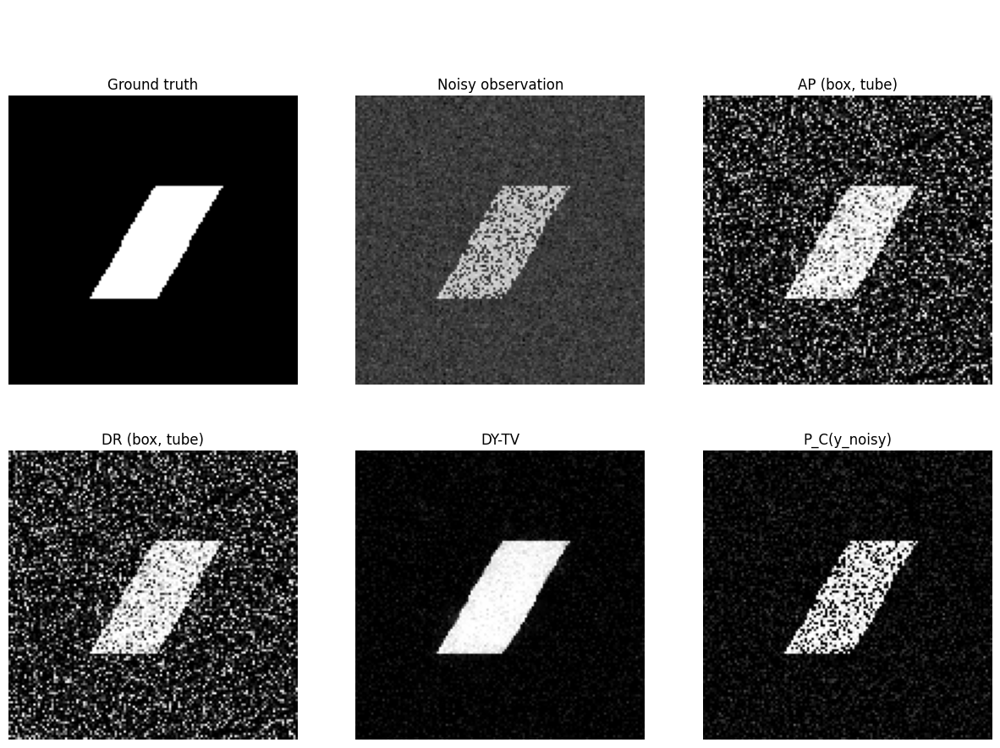

In [ ]:
# ---------------------------
# Animation: Display all frames as videos
# ---------------------------
import matplotlib.animation as animation
from IPython.display import HTML

# Create figure with 6 subplots for all methods
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

# Initialize images
im0 = axes[0].imshow(x_star[0], cmap='gray', vmin=0, vmax=1)
axes[0].set_title("Ground truth")
axes[0].axis('off')

im1 = axes[1].imshow(y_noisy[0], cmap='gray')
axes[1].set_title("Noisy observation")
axes[1].axis('off')

im2 = axes[2].imshow(clip01(x_AP[0]), cmap='gray', vmin=0, vmax=1)
axes[2].set_title(f"AP ({SECOND_SET}, {CONSISTENCY})")
axes[2].axis('off')

im3 = axes[3].imshow(clip01(x_DR[0]), cmap='gray', vmin=0, vmax=1)
axes[3].set_title(f"DR ({SECOND_SET}, {CONSISTENCY})")
axes[3].axis('off')

im4 = axes[4].imshow(clip01(x_DY[0]), cmap='gray', vmin=0, vmax=1)
axes[4].set_title(f"DY-TV")
axes[4].axis('off')

im5 = axes[5].imshow(clip01(P_C(y_noisy)[0]), cmap='gray', vmin=0, vmax=1)
axes[5].set_title("P_C(y_noisy)")
axes[5].axis('off')

# Add frame counter
frame_text = fig.suptitle(f'Frame 1/{num_frames}', fontsize=14, y=0.98)

def update(frame):
    """Update function for animation."""
    im0.set_array(x_star[frame])
    im1.set_array(y_noisy[frame])
    im2.set_array(clip01(x_AP[frame]))
    im3.set_array(clip01(x_DR[frame]))
    im4.set_array(clip01(x_DY[frame]))
    im5.set_array(clip01(P_C(y_noisy)[frame]))
    frame_text.set_text(f'Frame {frame+1}/{num_frames}')
    return [im0, im1, im2, im3, im4, im5, frame_text]

# Create animation (500ms per frame)
ani = animation.FuncAnimation(fig, update, frames=num_frames, interval=500, blit=True, repeat=True)

# plt.tight_layout()
plt.close(fig)  # Prevent static display in some environments

# Display animation in notebook
HTML(ani.to_jshtml())

In [44]:
# # ---------------------------
# # Alternative: Display all frames in a grid (non-animated)
# # ---------------------------
# # If animation doesn't work or you want to see all frames at once:

# fig, axes = plt.subplots(num_frames, 6, figsize=(18, 3*num_frames))

# for t in range(num_frames):
#     axes[t, 0].imshow(x_star[t], cmap='gray', vmin=0, vmax=1)
#     axes[t, 0].set_title(f"Ground truth (t={t+1})" if t == 0 else "")
#     axes[t, 0].set_ylabel(f"Frame {t+1}", fontsize=10)
#     axes[t, 0].axis('off')
    
#     axes[t, 1].imshow(y_noisy[t], cmap='gray')
#     axes[t, 1].set_title("Noisy obs" if t == 0 else "")
#     axes[t, 1].axis('off')
    
#     axes[t, 2].imshow(clip01(x_AP[t]), cmap='gray', vmin=0, vmax=1)
#     axes[t, 2].set_title("AP" if t == 0 else "")
#     axes[t, 2].axis('off')
    
#     axes[t, 3].imshow(clip01(x_DR[t]), cmap='gray', vmin=0, vmax=1)
#     axes[t, 3].set_title("DR" if t == 0 else "")
#     axes[t, 3].axis('off')
    
#     axes[t, 4].imshow(clip01(x_DY[t]), cmap='gray', vmin=0, vmax=1)
#     axes[t, 4].set_title("DY-TV" if t == 0 else "")
#     axes[t, 4].axis('off')
    
#     axes[t, 5].imshow(clip01(P_C(y_noisy)[t]), cmap='gray', vmin=0, vmax=1)
#     axes[t, 5].set_title("P_C(y)" if t == 0 else "")
#     axes[t, 5].axis('off')

# plt.tight_layout()
# plt.show()

In [45]:
# ---------------------------
# Save animation as MP4 (optional)
# ---------------------------
# Uncomment to save the animation as a video file
# Note: Requires ffmpeg to be installed

# fig, axes = plt.subplots(2, 3, figsize=(15, 10))
# axes = axes.flatten()
# 
# # ...same initialization code as above...
# 
# ani = animation.FuncAnimation(fig, update, frames=num_frames, interval=500, blit=True)
# 
# # Save as MP4
# Writer = animation.writers['ffmpeg']
# writer = Writer(fps=2, metadata=dict(artist='Split-as-a-Pro'), bitrate=1800)
# ani.save('video_restoration.mp4', writer=writer)
# print("Video saved as video_restoration.mp4")

## Results and diagnostics

We now compare the different operator–splitting schemes on the same degraded image.

- **First row (images):**  
  - Ground truth $x_\star$, noisy observation $y_{\text{noisy}}$,  
  - Reconstructions from AP and DR (with the chosen prior $\mathbf{C}$ and consistency mode $\mathbf{B}$),  
  - Reconstruction from Davis–Yin with TV regularization,  
  - Direct projection $P_{\mathbf{B}}(y_{\text{noisy}})$ for reference.  

- **Convergence (relative error):**  
  $\|x^k - x_\star\| / \|x_\star\|$ when $x_\star$ is known (synthetic / camera).  
  AP and DR solve a feasibility problem, DY–TV solves an approximation problem.  

- **Feasibility residual (AP/DR):**  
  $\|P_{\mathbf{B}}(w^k) - P_{\mathbf{C}}(w^k)\|_F$, which vanishes if the sets intersect.  
  Useful to diagnose whether feasibility is consistent with the noise level.  

- **DY–TV objective:**  
  Monitors $\lambda\,\mathrm{TV}(x^k)$ along the iterations, showing progress of the approximation scheme.


## Notes

- **Tuning:**  
  • Swap `SECOND_SET` between `'box'` and `'lowpass'` to compare geometry vs. smoothness priors.  
  • Adjust `LAMBDA_TV` and `TV_INNER_IT` for TV regularization (larger values → stronger smoothing).  
  • Reconstructions and metrics are displayed after clipping to $[0,1]$, though the algorithms do not require clipping internally.

- **Datasets:**  
  • `synthetic` → simple white rectangle on black background,  
  • `camera` → standard grayscale photo from `skimage`.